In [14]:
# Implementation of WGAN-GP (https://arxiv.org/abs/1704.00028) for pokemon generating
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
from torch.utils.data import DataLoader
from torchvision.utils import save_image
from torchvision.utils import make_grid
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

In [15]:
# Hyperparameters
device = 'cuda' if torch.cuda.is_available() else 'cpu'
LEARNING_RATE = 1e-4
BATCH_SIZE = 64
IMAGE_SIZE = 128
CHANNELS_IMG = 3
Z_DIM = 100
NUM_EPOCHS = 100
CRITIC_CHANNELS = 64
GEN_CHANNELS = 64
CRITIC_ITERATIONS = 5
LAMBDA_GP = 10
DATA_DIR = '/kaggle/input/pokemon-image-dataset'
STATS = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [16]:
class Critic(nn.Module):
    def __init__(self, channels_img=3, critic_channels=64):
        super().__init__()
        self.critic = nn.Sequential(
            # input images: BATCH_SIZE x channels_img x 128 x 128
            nn.Conv2d(channels_img, critic_channels, 4, 2, 1),
            nn.LeakyReLU(0.2),
            # out: BATCH_SIZE x (critic_channels * 1) x 64 x 64
            self._critic_block(critic_channels, critic_channels * 2, 4, 2, 1),
            # out: BATCH_SIZE x (critic_channels * 2) x 32 x 32,
            self._critic_block(critic_channels * 2, critic_channels * 4, 4, 2, 1),
            # out: BATCH_SIZE x (critic_channels * 4) x 16 x 16,
            self._critic_block(critic_channels * 4, critic_channels * 8, 4, 2, 1),
            # out: BATCH_SIZE x (critic_channels * 8) x 8 x 8,
            self._critic_block(critic_channels * 8, critic_channels * 16, 4, 2, 1),
            # out: BATCH_SIZE x (critic_channels * 16) x 4 x 4,
            nn.Conv2d(critic_channels * 16, 1, 4, 2, 0)
            # out: BATCH_SIZE x 1 x 1 x 1
            # tanh or sigmoid are not used, because we're using MSE loss instead of BCE
        )
    
    def _critic_block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
                            nn.InstanceNorm2d(out_channels, affine=True),
                            nn.LeakyReLU(0.2))
    
    def forward(self, x):
        return self.critic(x)

In [17]:
class Generator(nn.Module):
    def __init__(self, z_dim=100, channels_img=3, gen_channels=64):
        super().__init__()
        self.gen = nn.Sequential(
            # input noise: BATCH_SIZE x z_dim x 1 x 1
            self._gen_block(z_dim, gen_channels * 16, 4, 1, 0),
            # out: BATCH_SIZE x (gen_channels * 16) x 4 x 4
            self._gen_block(gen_channels * 16, gen_channels * 8, 4, 2, 1),
            # out: BATCH_SIZE x (gen_channels * 8) x 8 x 8
            self._gen_block(gen_channels * 8, gen_channels * 4, 4, 2, 1),
            # out: BATCH_SIZE x (gen_channels * 4) x 16 x 16
            self._gen_block(gen_channels * 4, gen_channels * 2, 4, 2, 1),
            # out: BATCH_SIZE x (gen_channels * 2) x 32 x 32
            self._gen_block(gen_channels * 2, gen_channels, 4, 2, 1),
            # out: BATCH_SIZE x (gen_channels * 2) x 64 x 64
            nn.ConvTranspose2d(gen_channels, channels_img, 4, 2, 1),
            # out: BATCH_SIZE x channels_img x 128 x 128
            nn.Tanh()
            # normalization from -1 to 1, since all images are normalized
        )
    
    def _gen_block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
                            nn.BatchNorm2d(out_channels),
                            nn.ReLU(0.2))
    
    def forward(self, x):
        return self.gen(x)

In [18]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.InstanceNorm2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)

In [19]:
def gradient_penalty(critic, real_imgs, fake_imgs, device='cpu'):
    batch_size, channels, height, width = real_imgs.shape
    eps = torch.rand((batch_size, 1, 1, 1)).repeat(1, channels, height, width).to(device)
    # creating new mixed images in the form: x*eps + (1-eps)*x', where x, x' are real and fake images
    mixed_imgs = real_imgs * eps + (1 - eps) * fake_imgs
    
    # Critic output to mixed_images
    critic_mix_out = critic(mixed_imgs)
    # Calculating gradient penalty with respect to the mixed_images
    gradient = torch.autograd.grad(inputs=mixed_imgs,
                                   outputs=critic_mix_out,
                                   grad_outputs=torch.ones_like(critic_mix_out),
                                   create_graph=True,
                                   retain_graph=True)[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

In [20]:
def data_getter(dataset_path: str):
    transform = tt.Compose([
        tt.Pad(padding=300, padding_mode='constant', fill=(255, 255, 255)),
        tt.CenterCrop(size=(400, 400)),
        tt.Resize(size=(IMAGE_SIZE, IMAGE_SIZE)),
        tt.RandomAdjustSharpness(sharpness_factor=2.5, p=0.8),
        tt.ToTensor(),
        tt.Normalize(*STATS)
    ])
    
    transform_persp = tt.Compose([
        tt.Pad(padding=300, padding_mode='constant', fill=(255, 255, 255)),
        tt.CenterCrop(size=(400, 400)),
        tt.Resize(size=(IMAGE_SIZE, IMAGE_SIZE)),
        tt.RandomPerspective(p=1, fill=(255, 255, 255)),
        tt.RandomAdjustSharpness(sharpness_factor=2.5, p=0.8),
        tt.ToTensor(),
        tt.Normalize(*STATS)
    ])

    transform_rotR = tt.Compose([
        tt.Pad(padding=300, padding_mode='constant', fill=(255, 255, 255)),
        tt.CenterCrop(size=(400, 400)),
        tt.Resize(size=(IMAGE_SIZE, IMAGE_SIZE)),
        tt.RandomRotation(degrees=(30, 45), fill=(255, 255, 255)),
        tt.RandomAdjustSharpness(sharpness_factor=2.5, p=0.8),
        tt.ToTensor(),
        tt.Normalize(*STATS)
    ])

    transform_rotL = tt.Compose([
        tt.Pad(padding=300, padding_mode='constant', fill=(255, 255, 255)),
        tt.CenterCrop(size=(400, 400)),
        tt.Resize(size=(IMAGE_SIZE, IMAGE_SIZE)),
        tt.RandomRotation(degrees=(-45, -30), fill=(255, 255, 255)),
        tt.RandomAdjustSharpness(sharpness_factor=2.5, p=0.8),
        tt.ToTensor(),
        tt.Normalize(*STATS)
    ])


    transform_HorizontalFlip = tt.Compose([
        tt.Pad(padding=300, padding_mode='constant', fill=(255, 255, 255)),
        tt.CenterCrop(size=(400, 400)),
        tt.Resize(size=(IMAGE_SIZE, IMAGE_SIZE)),
        tt.RandomHorizontalFlip(p=1),
        tt.RandomAdjustSharpness(sharpness_factor=2.5, p=0.8),
        tt.ToTensor(),
        tt.Normalize(*STATS)
    ])

    dataset_normal = ImageFolder(root=dataset_path, transform=transform)
    dataset_persp = ImageFolder(root=dataset_path, transform=transform_persp)
    dataset_rotR = ImageFolder(root=dataset_path, transform=transform_rotR)
    dataset_rotL = ImageFolder(root=dataset_path, transform=transform_rotL)
    dataset_HorizontalFlip = ImageFolder(root=dataset_path, transform=transform_HorizontalFlip)
    return torch.utils.data.ConcatDataset([dataset_normal, dataset_persp, dataset_rotR, dataset_rotL, dataset_HorizontalFlip])

In [21]:
def denorm(img_tensors):
    return img_tensors * STATS[1][0] + STATS[0][0]

In [9]:
dataset = data_getter(DATA_DIR)
dloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

In [10]:
generator = Generator(Z_DIM, CHANNELS_IMG, GEN_CHANNELS).to(device)
critic = Critic(CHANNELS_IMG, CRITIC_CHANNELS).to(device)
initialize_weights(generator)
initialize_weights(critic)

In [11]:
opt_generator = optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))
opt_critic = optim.Adam(critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))

In [261]:
fixed_z = torch.randn(32, Z_DIM, 1, 1).to(device)

In [13]:
generator.train()
critic.train()

Critic(
  (critic): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (5): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), paddin

In [14]:
losses_critic = []
losses_generator = []

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [1/100], loss_crit: -136.2741, loss_gen: 64.6866


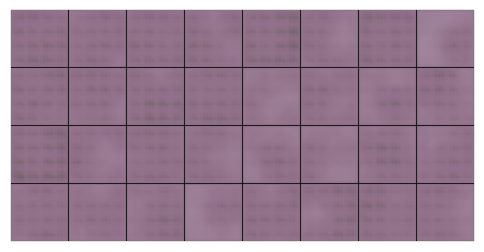

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [2/100], loss_crit: -591.8705, loss_gen: 335.9721


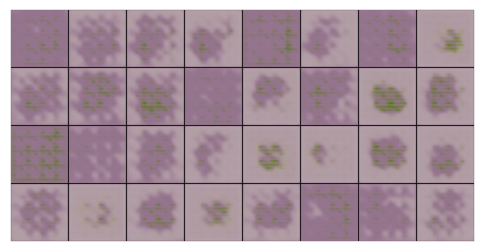

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [3/100], loss_crit: -560.6185, loss_gen: 414.7351


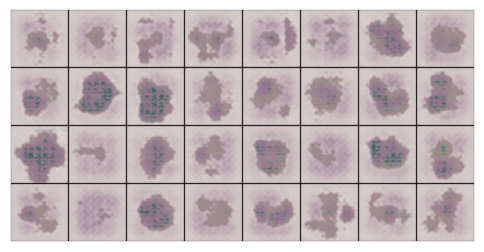

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [4/100], loss_crit: -288.1803, loss_gen: 237.2265


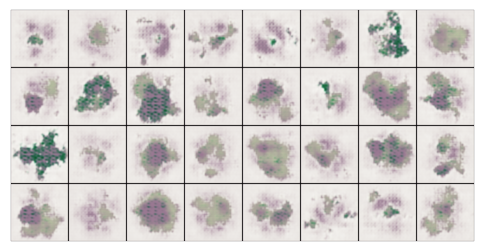

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [5/100], loss_crit: -174.0467, loss_gen: 188.8079


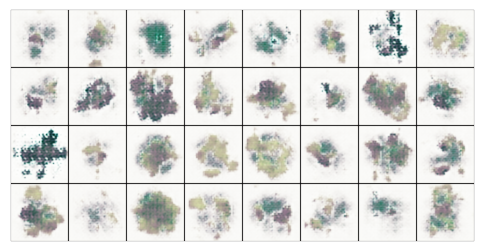

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [6/100], loss_crit: -143.5952, loss_gen: 177.0201


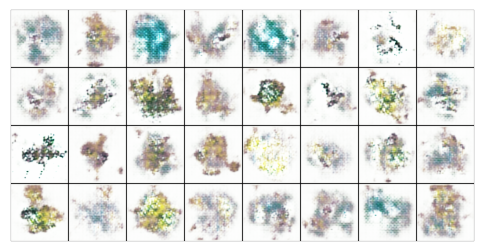

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [7/100], loss_crit: -116.5493, loss_gen: 173.1294


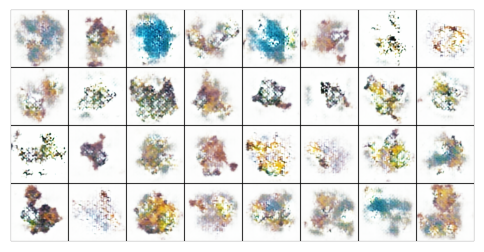

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [8/100], loss_crit: -90.7405, loss_gen: 175.2833


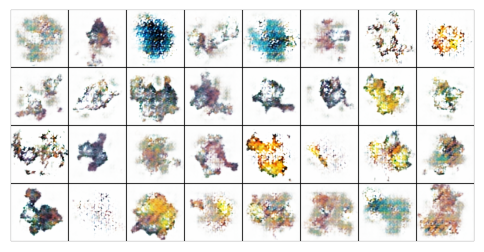

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [9/100], loss_crit: -77.8629, loss_gen: 170.1981


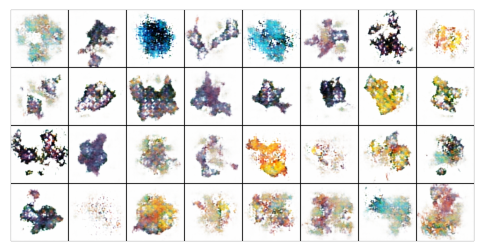

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [10/100], loss_crit: -71.6432, loss_gen: 158.0056


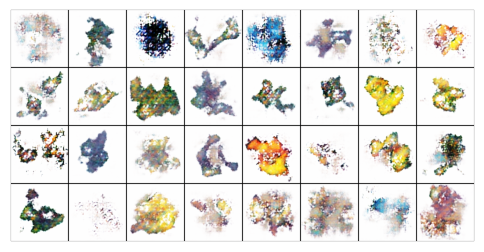

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [11/100], loss_crit: -71.2533, loss_gen: 146.2359


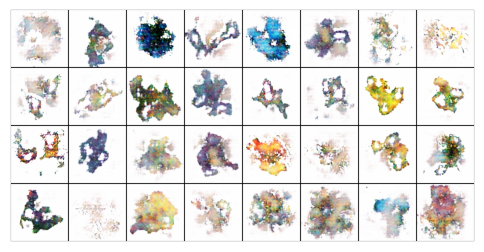

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [12/100], loss_crit: -67.7994, loss_gen: 136.3258


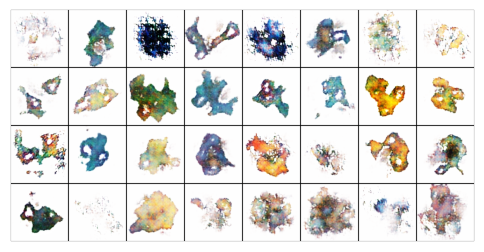

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [13/100], loss_crit: -63.5177, loss_gen: 131.1026


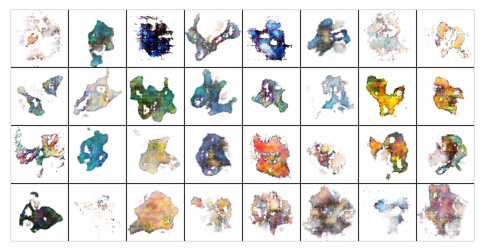

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [14/100], loss_crit: -58.6013, loss_gen: 128.0860


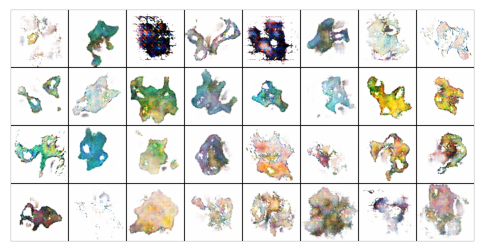

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [15/100], loss_crit: -56.1939, loss_gen: 122.7646


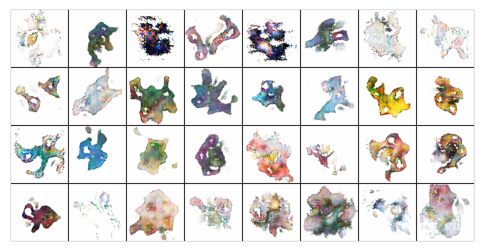

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [16/100], loss_crit: -52.5291, loss_gen: 120.7981


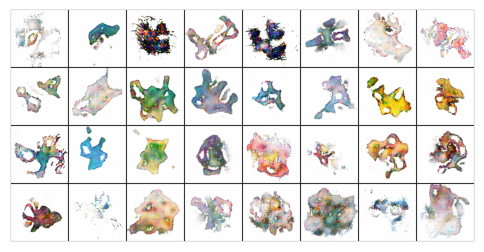

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [17/100], loss_crit: -50.3664, loss_gen: 123.5305


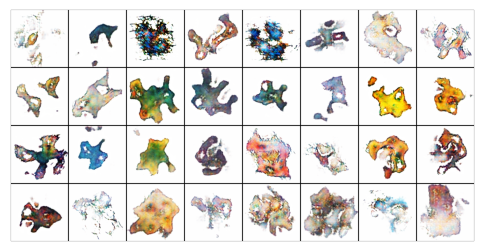

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [18/100], loss_crit: -49.0598, loss_gen: 122.4111


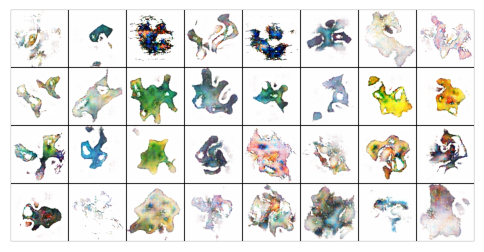

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [19/100], loss_crit: -48.1853, loss_gen: 117.6667


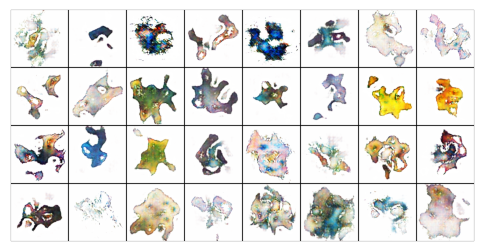

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [20/100], loss_crit: -46.8849, loss_gen: 112.9652


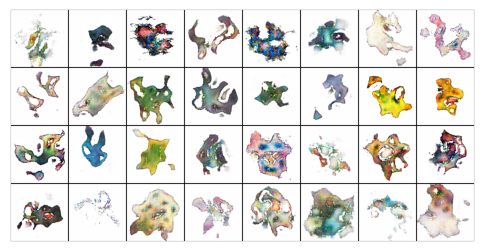

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [21/100], loss_crit: -45.6835, loss_gen: 110.9351


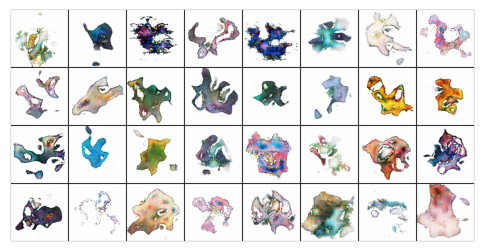

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [22/100], loss_crit: -44.6396, loss_gen: 111.9698


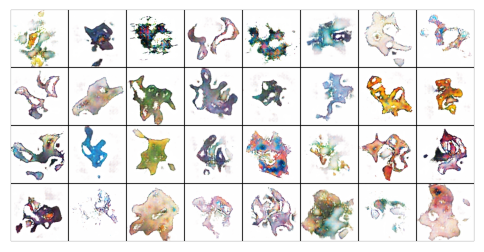

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [23/100], loss_crit: -43.2485, loss_gen: 113.5916


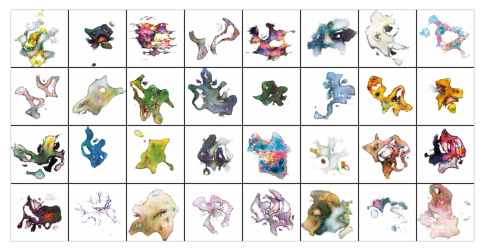

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [24/100], loss_crit: -44.1608, loss_gen: 115.6899


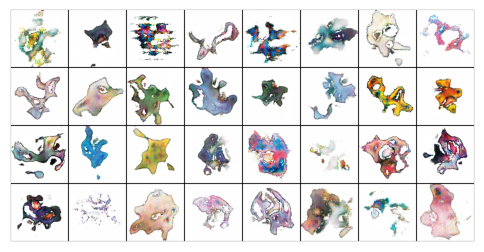

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [25/100], loss_crit: -42.9053, loss_gen: 117.6970


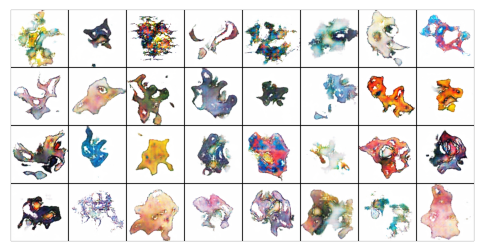

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [26/100], loss_crit: -40.6721, loss_gen: 115.2394


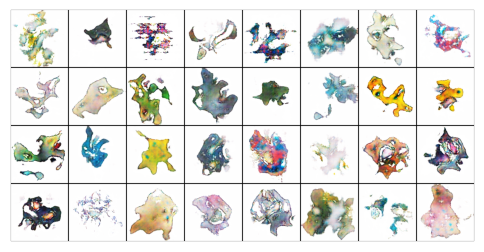

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [27/100], loss_crit: -40.8394, loss_gen: 115.8520


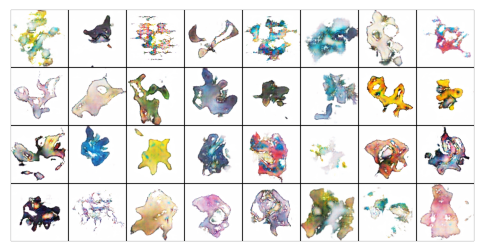

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [28/100], loss_crit: -42.8048, loss_gen: 115.9688


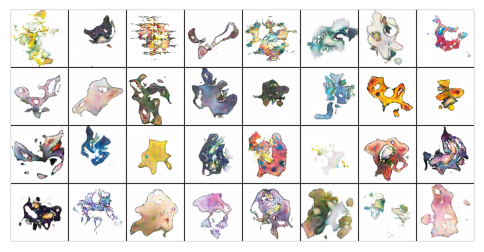

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [29/100], loss_crit: -43.5856, loss_gen: 118.7744


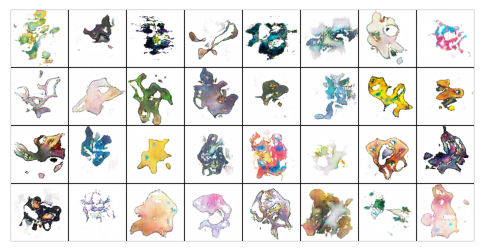

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [30/100], loss_crit: -43.0880, loss_gen: 121.8666


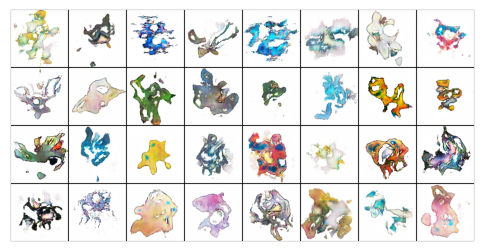

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [31/100], loss_crit: -42.8816, loss_gen: 119.1105


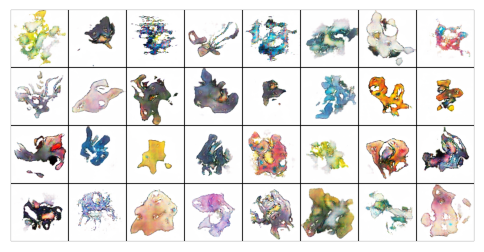

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [32/100], loss_crit: -44.0328, loss_gen: 122.6503


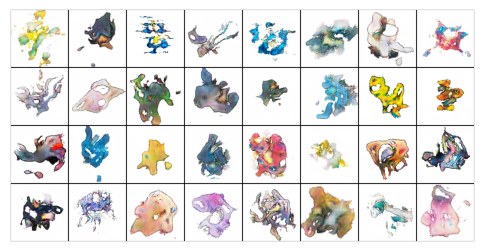

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [33/100], loss_crit: -43.9186, loss_gen: 122.9075


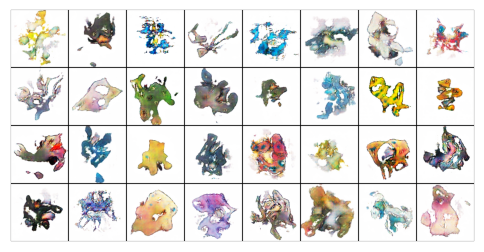

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [34/100], loss_crit: -44.6186, loss_gen: 126.1288


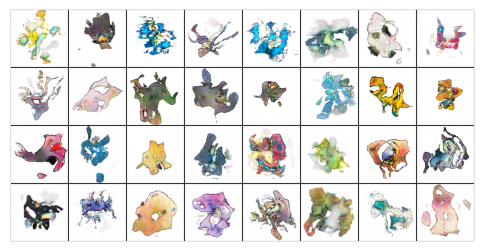

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [35/100], loss_crit: -44.2163, loss_gen: 124.4441


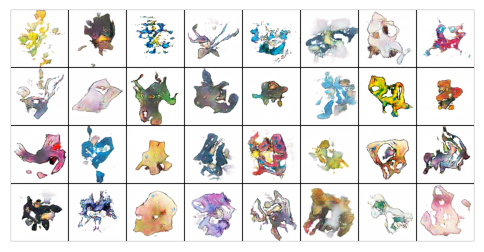

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [36/100], loss_crit: -45.0893, loss_gen: 127.9891


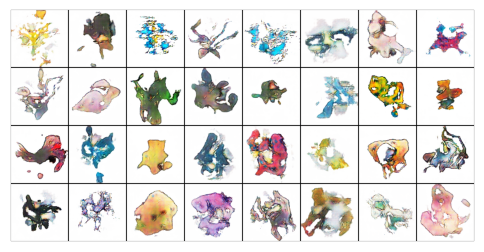

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [37/100], loss_crit: -44.4354, loss_gen: 129.0655


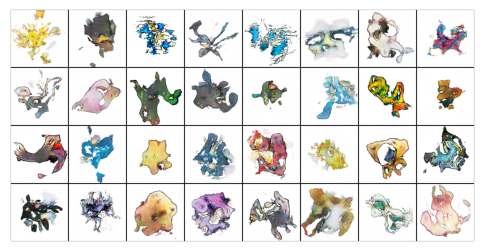

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [38/100], loss_crit: -44.5558, loss_gen: 134.0228


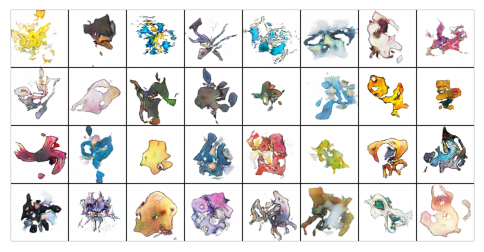

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [39/100], loss_crit: -44.1687, loss_gen: 137.7605


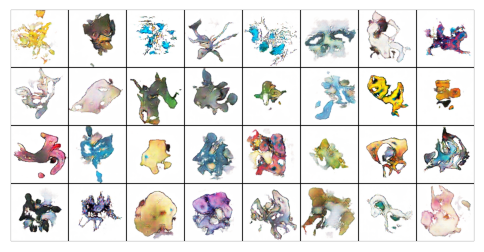

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [40/100], loss_crit: -45.4411, loss_gen: 139.8305


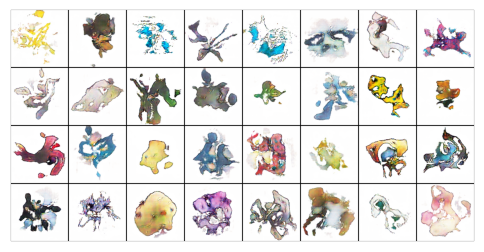

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [41/100], loss_crit: -45.0248, loss_gen: 138.3473


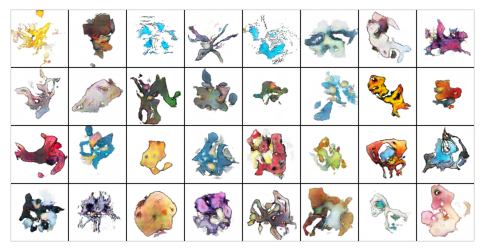

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [42/100], loss_crit: -45.9297, loss_gen: 142.4636


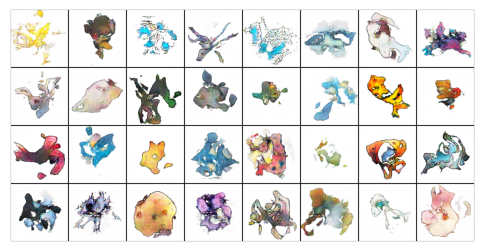

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [43/100], loss_crit: -46.3635, loss_gen: 147.4237


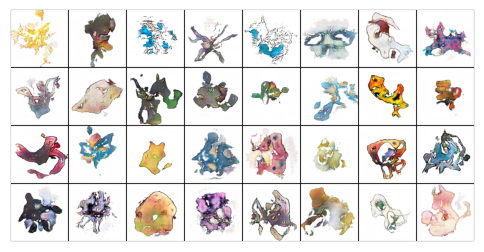

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [44/100], loss_crit: -46.6851, loss_gen: 151.8736


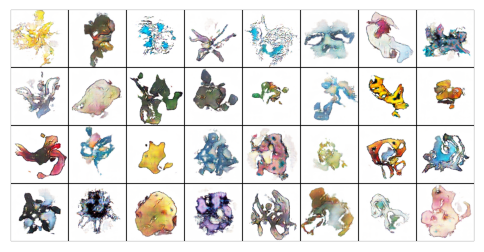

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [45/100], loss_crit: -46.6463, loss_gen: 154.0339


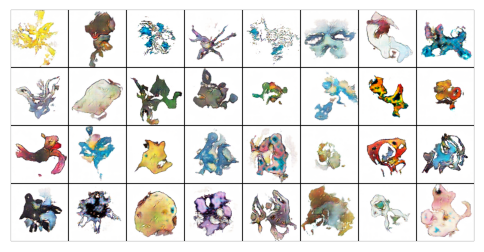

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [46/100], loss_crit: -46.4059, loss_gen: 158.1157


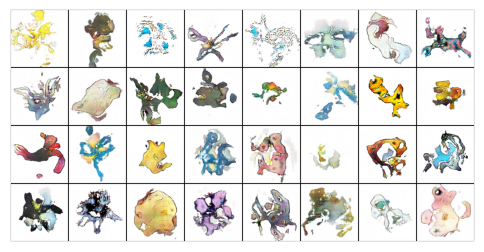

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [47/100], loss_crit: -47.4070, loss_gen: 161.5217


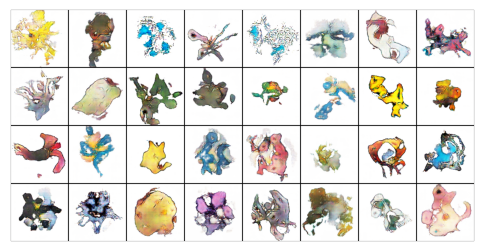

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [48/100], loss_crit: -46.9112, loss_gen: 166.3487


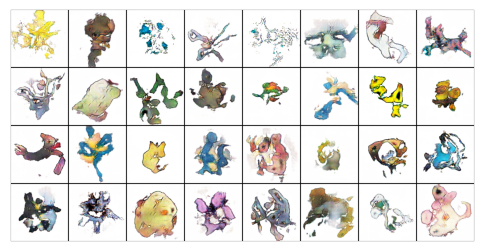

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [49/100], loss_crit: -46.8597, loss_gen: 168.3126


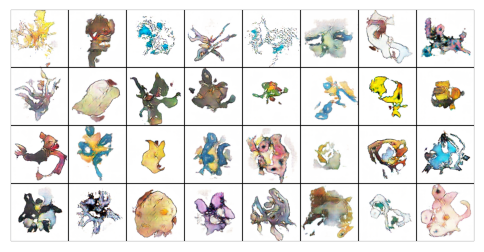

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [50/100], loss_crit: -47.6004, loss_gen: 172.0716


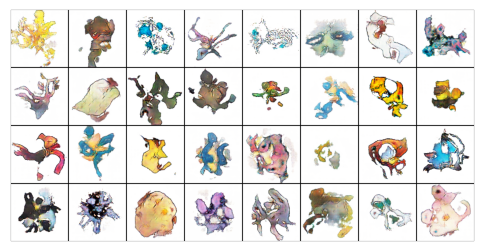

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [51/100], loss_crit: -48.4753, loss_gen: 174.2973


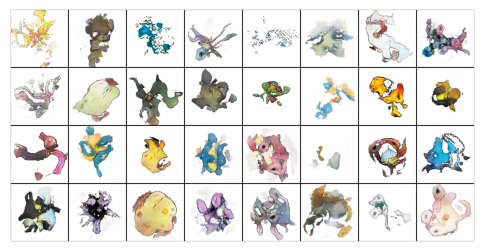

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [52/100], loss_crit: -48.9145, loss_gen: 179.1110


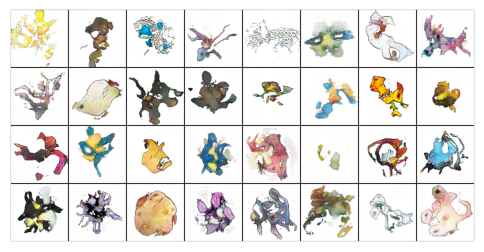

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [53/100], loss_crit: -48.7215, loss_gen: 181.5330


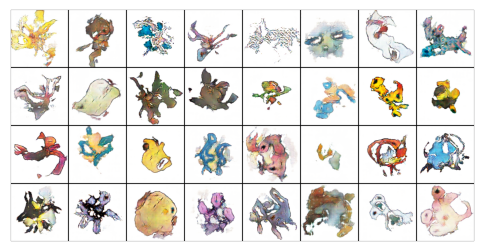

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [54/100], loss_crit: -48.3592, loss_gen: 184.2771


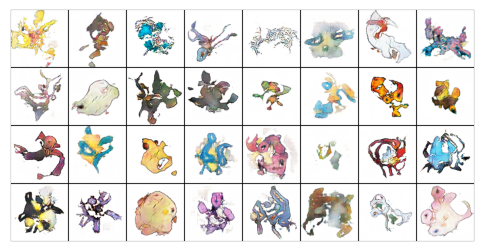

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [55/100], loss_crit: -48.5523, loss_gen: 189.7697


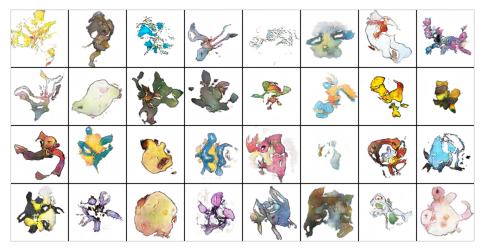

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [56/100], loss_crit: -49.4815, loss_gen: 194.5846


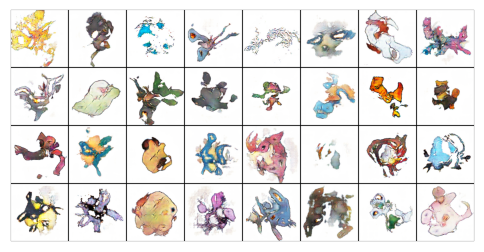

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [57/100], loss_crit: -49.1303, loss_gen: 199.1537


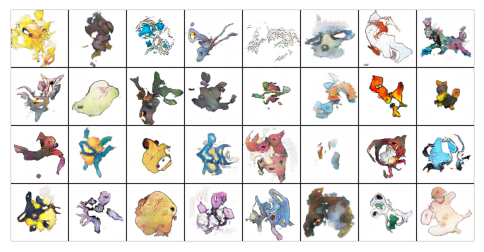

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [58/100], loss_crit: -51.3494, loss_gen: 197.7897


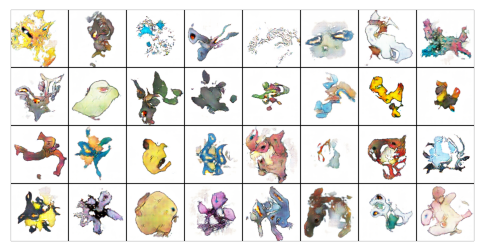

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [59/100], loss_crit: -50.9652, loss_gen: 202.0558


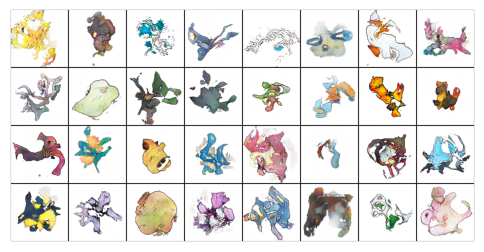

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [60/100], loss_crit: -50.6675, loss_gen: 207.7500


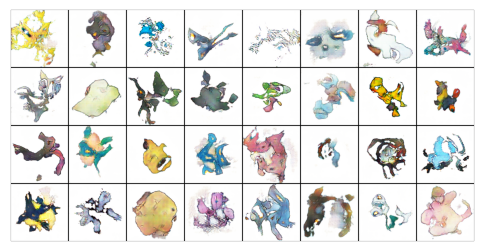

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [61/100], loss_crit: -50.2384, loss_gen: 209.4791


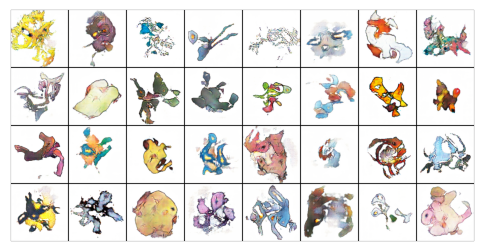

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [62/100], loss_crit: -50.8939, loss_gen: 219.3598


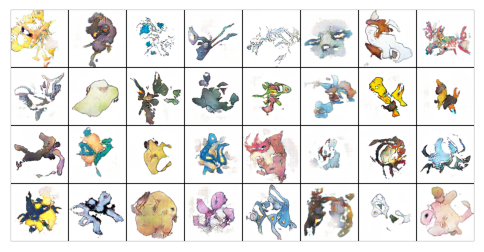

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [63/100], loss_crit: -51.0961, loss_gen: 223.1763


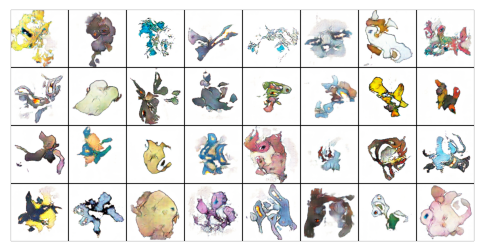

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [64/100], loss_crit: -50.4495, loss_gen: 227.8246


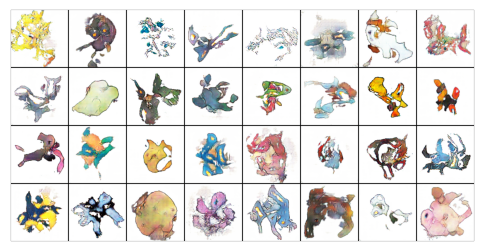

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [65/100], loss_crit: -52.0094, loss_gen: 235.7944


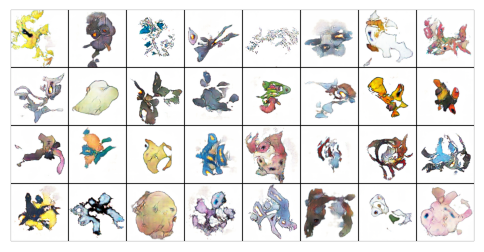

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [66/100], loss_crit: -51.3890, loss_gen: 239.9090


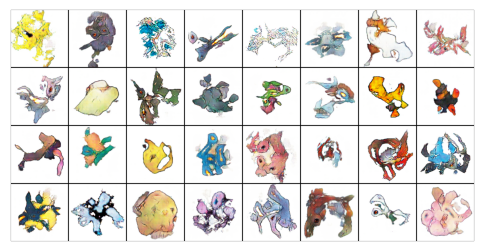

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [67/100], loss_crit: -51.3481, loss_gen: 249.4784


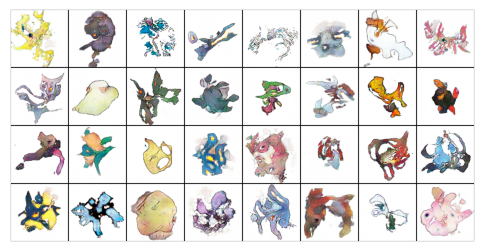

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [68/100], loss_crit: -52.1494, loss_gen: 253.9596


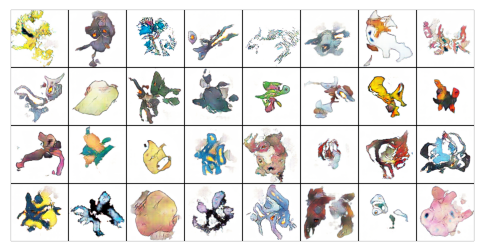

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [69/100], loss_crit: -52.5038, loss_gen: 263.0434


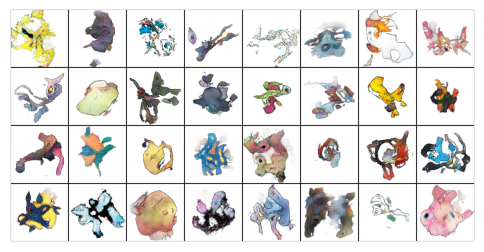

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [70/100], loss_crit: -52.6168, loss_gen: 269.6795


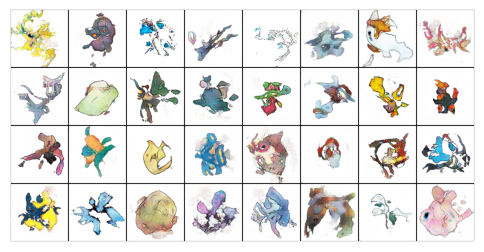

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [71/100], loss_crit: -51.6743, loss_gen: 271.2220


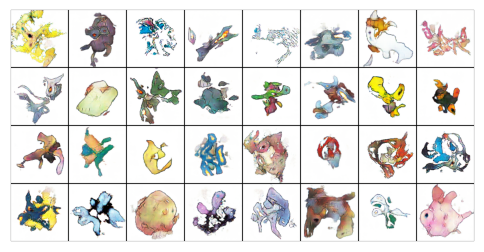

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [72/100], loss_crit: -52.8170, loss_gen: 271.8707


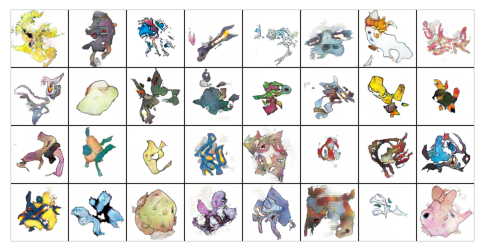

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [73/100], loss_crit: -52.6943, loss_gen: 281.8795


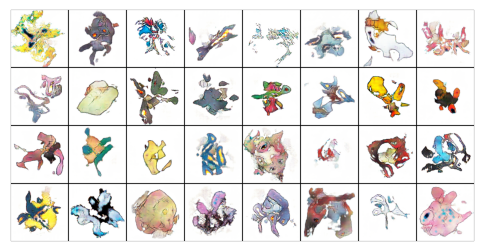

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [74/100], loss_crit: -54.0093, loss_gen: 293.3773


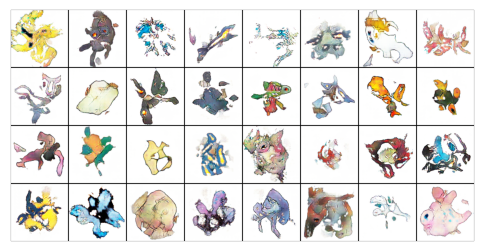

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [75/100], loss_crit: -53.5311, loss_gen: 299.3901


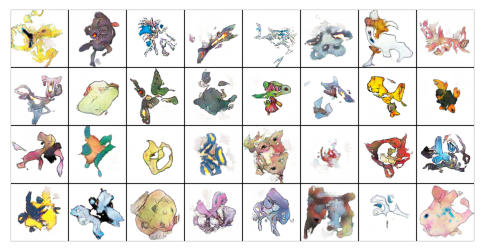

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [76/100], loss_crit: -53.3502, loss_gen: 308.6413


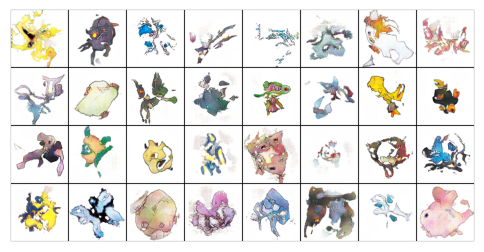

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [77/100], loss_crit: -54.2851, loss_gen: 316.0598


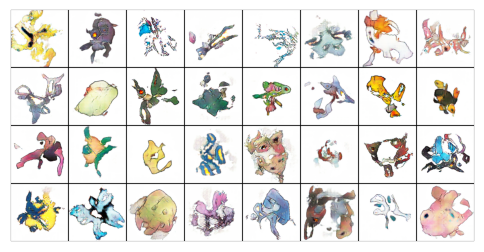

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [78/100], loss_crit: -53.4933, loss_gen: 321.1183


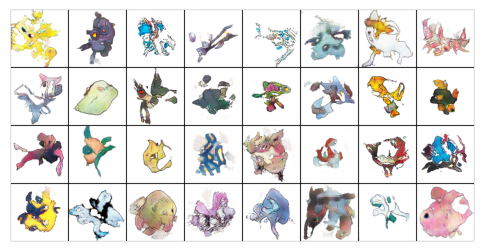

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [79/100], loss_crit: -54.3065, loss_gen: 325.5886


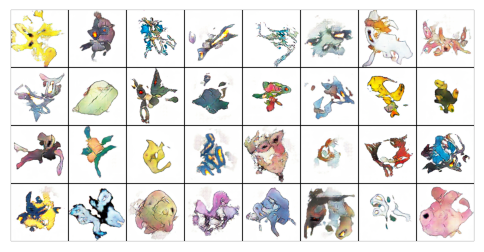

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [80/100], loss_crit: -55.3828, loss_gen: 334.5966


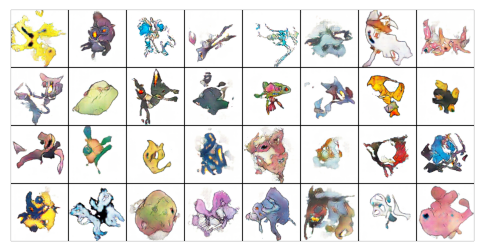

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [81/100], loss_crit: -55.8365, loss_gen: 344.8722


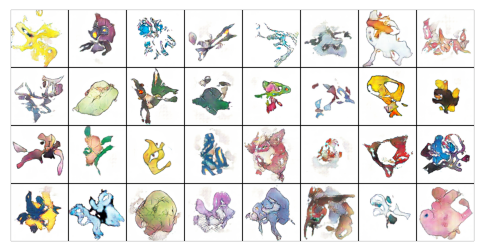

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [82/100], loss_crit: -55.9244, loss_gen: 352.0477


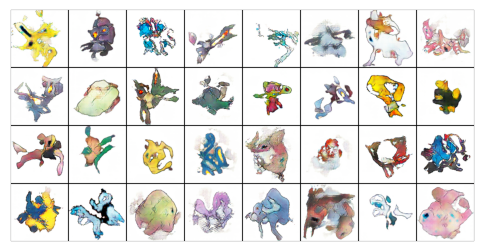

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [83/100], loss_crit: -57.1562, loss_gen: 364.5398


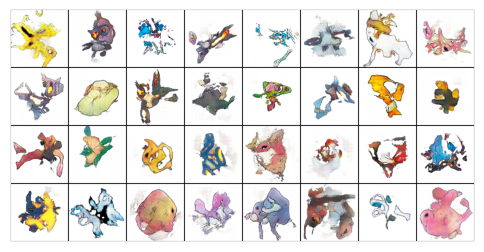

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [84/100], loss_crit: -56.5804, loss_gen: 371.2538


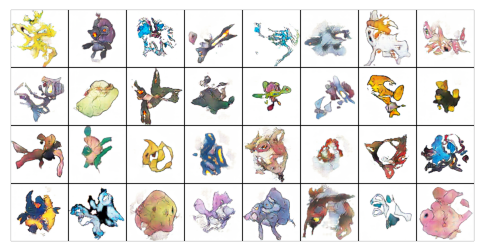

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [85/100], loss_crit: -56.2904, loss_gen: 373.1687


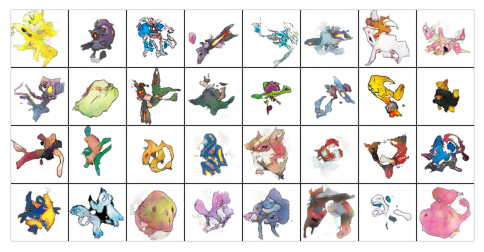

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [86/100], loss_crit: -55.9664, loss_gen: 380.4129


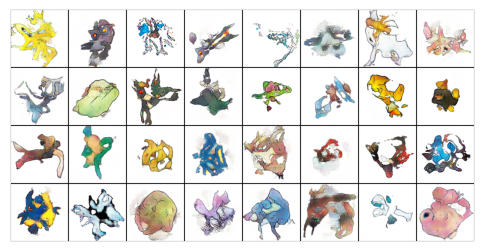

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [87/100], loss_crit: -56.8891, loss_gen: 391.7020


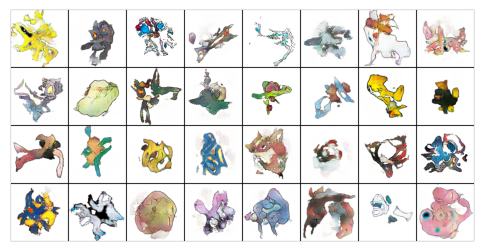

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [88/100], loss_crit: -57.9890, loss_gen: 406.2031


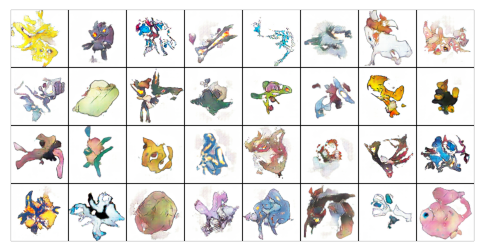

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [89/100], loss_crit: -57.0047, loss_gen: 410.7008


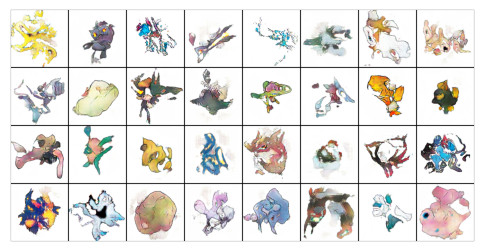

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [90/100], loss_crit: -58.4894, loss_gen: 418.8767


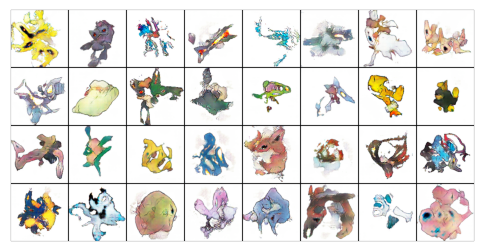

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [91/100], loss_crit: -58.4745, loss_gen: 434.1513


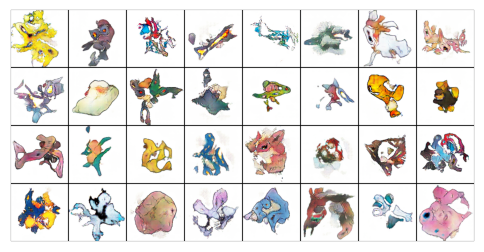

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [92/100], loss_crit: -57.7202, loss_gen: 442.3392


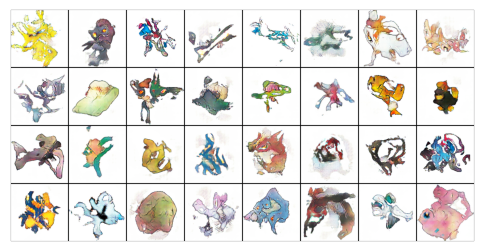

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [93/100], loss_crit: -58.2880, loss_gen: 450.1783


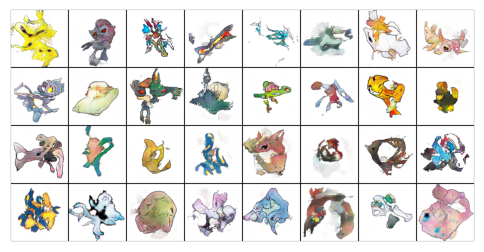

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [94/100], loss_crit: -58.9094, loss_gen: 459.8625


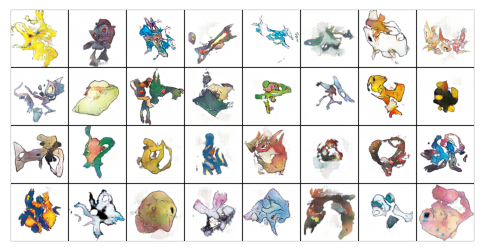

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [95/100], loss_crit: -59.1331, loss_gen: 468.1242


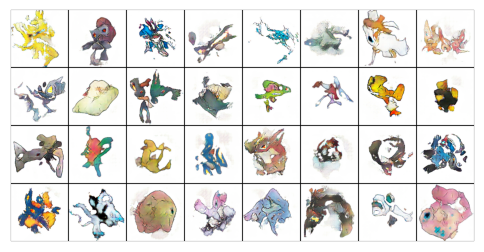

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [96/100], loss_crit: -59.5721, loss_gen: 474.7891


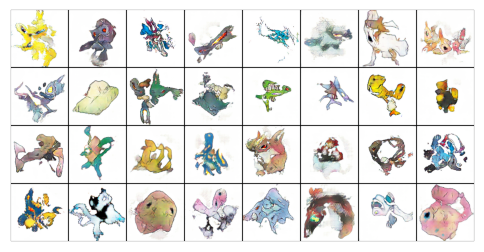

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [97/100], loss_crit: -59.4004, loss_gen: 486.1219


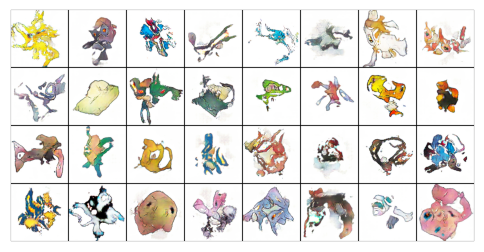

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [98/100], loss_crit: -60.0497, loss_gen: 503.9109


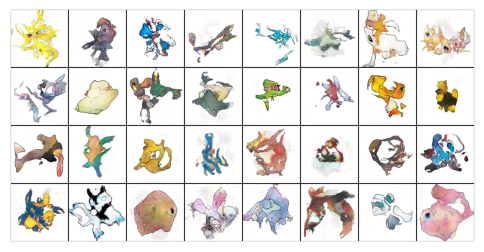

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [99/100], loss_crit: -60.0042, loss_gen: 508.0167


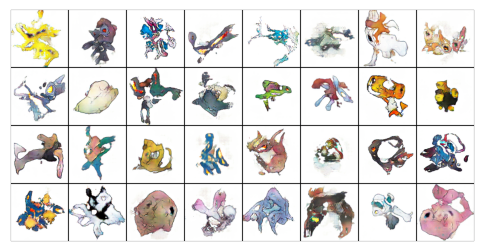

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [100/100], loss_crit: -60.3016, loss_gen: 513.5819


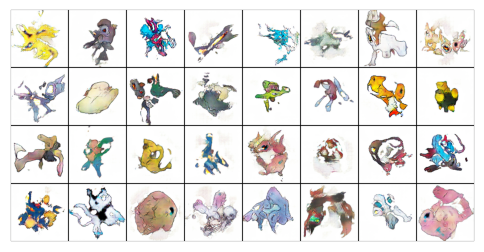

In [15]:
# Training loop
for epoch in range(NUM_EPOCHS):
    losses_critic_per_epoch = []
    losses_generator_per_epoch = []
    for real_images, _ in tqdm(dloader):
        real_images = real_images.to(device)

        # train critic: min -(E[critic(real)] - E[critic(generator(noise))]) + lambda * (||grad D|| - 1) ^ 2
        for _ in range(CRITIC_ITERATIONS):
            latent_noise = torch.randn(real_images.shape[0], Z_DIM, 1, 1).to(device)
            fake_images = generator(latent_noise)
            critic_real_out = critic(real_images)
            critic_fake_out = critic(fake_images)
            gp = gradient_penalty(critic, real_images, fake_images, device=device)
            loss_critic = -(torch.mean(critic_real_out) - torch.mean(critic_fake_out)) + LAMBDA_GP * gp
            critic.zero_grad()
            loss_critic.backward(retain_graph=True)
            opt_critic.step()

        # train generator: min -E[critic(fake)]
        critic_fake_out2 = critic(fake_images).reshape(-1)
        loss_generator = - torch.mean(critic_fake_out2)
        generator.zero_grad()
        loss_generator.backward()
        opt_generator.step()
        
        losses_critic_per_epoch.append(loss_critic.item())
        losses_generator_per_epoch.append(loss_generator.item())
    # Record losses 
    losses_critic.append(np.mean(losses_critic_per_epoch))
    losses_generator.append(np.mean(losses_generator_per_epoch))
    
    # Print losses
    print("Epoch [{}/{}], loss_crit: {:.4f}, loss_gen: {:.4f}".format(
            epoch+1, NUM_EPOCHS, 
            losses_critic[-1], losses_generator[-1]))
    
    # Save model states
    if epoch % 5 == 0:
        torch.save(generator.state_dict(), f'model_{epoch}.pth')

    # Print generated images from the fixed z
    with torch.no_grad():
        showed_images = generator(fixed_z).cpu()
        fig, ax = plt.subplots(figsize=(6, 6))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(denorm(showed_images.detach()[:32]), nrow=8).permute(1, 2, 0))
        plt.show()

In [16]:
torch.save(generator.state_dict(), 'model.pth')

In [195]:
def save_samples(index, gen_model, latent_tensors, show=True):
    fake_images = gen_model(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(12, 12))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [283]:
generator_tuned = Generator(Z_DIM, CHANNELS_IMG, GEN_CHANNELS).to(device)

In [284]:
generator_tuned.load_state_dict(torch.load('WGAN_GP_model_128x128_100.pth', map_location=torch.device('cpu')))

<All keys matched successfully>

In [285]:
noise = torch.randn(64, Z_DIM, 1, 1).to(device)

In [286]:
sample_dir = 'wgangp_generated_128x128_100'
os.makedirs(sample_dir, exist_ok=True)

In [287]:
save_samples(100, generator_tuned, noise, show=False)

Saving generated-images-0100.png
